# Programming Project #1: Hybrid Images

## CS445: Computational Photography - Fall 2020

### Part I: Hybrid Images

In [1]:
import cv2

import numpy as np
import copy as cp
from matplotlib.colors import LogNorm
from matplotlib.colors import hsv_to_rgb
from scipy import signal

import utils

In [2]:
%matplotlib notebook
import matplotlib.pyplot as plt

In [3]:
def getKernelSize(size, ratio=0.03):
    '''
    Inputs:
        size: Tuple representing dimentions of image
        ratio: desired relative size of kernel
        
    Output:
        Returns an integer representing relative kernel size of given dimension.
    '''
    y, x = size
    
    # Select shorter dimension
    if x >= y:
        short = y
    else:
        short = x
        
    # Compute relative kernel size and round to integer
    raw_size = int(short*ratio)
    
    # Round up to odd integer
    if raw_size % 2 == 0:
        return raw_size + 1
    else:
        return raw_size

In [4]:
# Image source: Adam Griffith (https://unsplash.com/photos/T2606yIujjw)
im1_file = './hybrid1_a.jpg'
# Image source: Mateusz Delegacz (https://unsplash.com/photos/1Ah8CAwk3vM)
im2_file = './hybrid1_b.jpg'

im1 = cv2.imread(im1_file, cv2.IMREAD_GRAYSCALE)
im2 = cv2.imread(im2_file, cv2.IMREAD_GRAYSCALE)

<IPython.core.display.Javascript object>


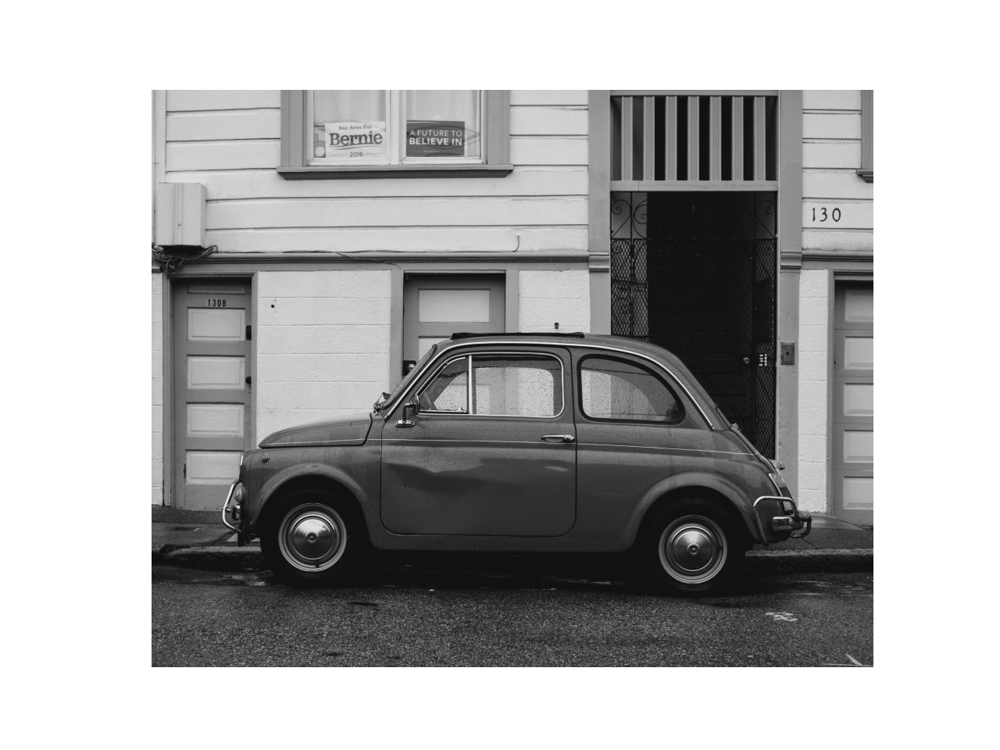

In [5]:
pts_im1 = utils.prompt_eye_selection(im1)

<IPython.core.display.Javascript object>


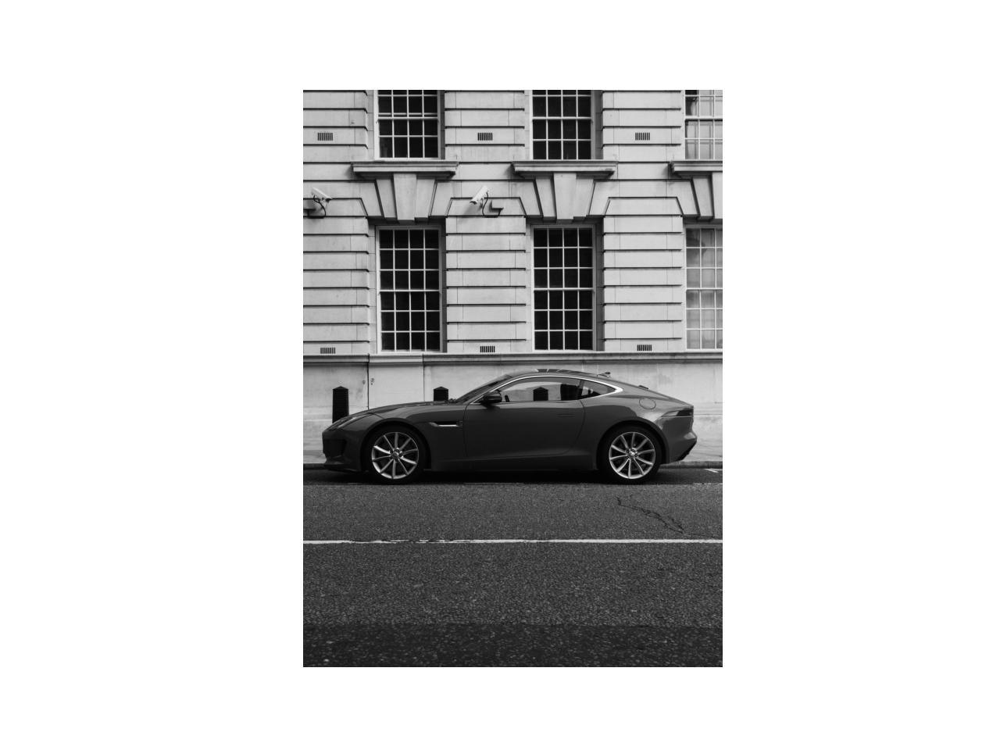

In [6]:
pts_im2 = utils.prompt_eye_selection(im2)

In [7]:
im1, im2 = utils.align_images(im1_file, im2_file,pts_im1,pts_im2,save_images=False)

In [8]:
# Convert to grayscale
im1 = cv2.cvtColor(im1, cv2.COLOR_BGR2GRAY) / 255.0
im2 = cv2.cvtColor(im2, cv2.COLOR_BGR2GRAY) / 255.0

<IPython.core.display.Javascript object>


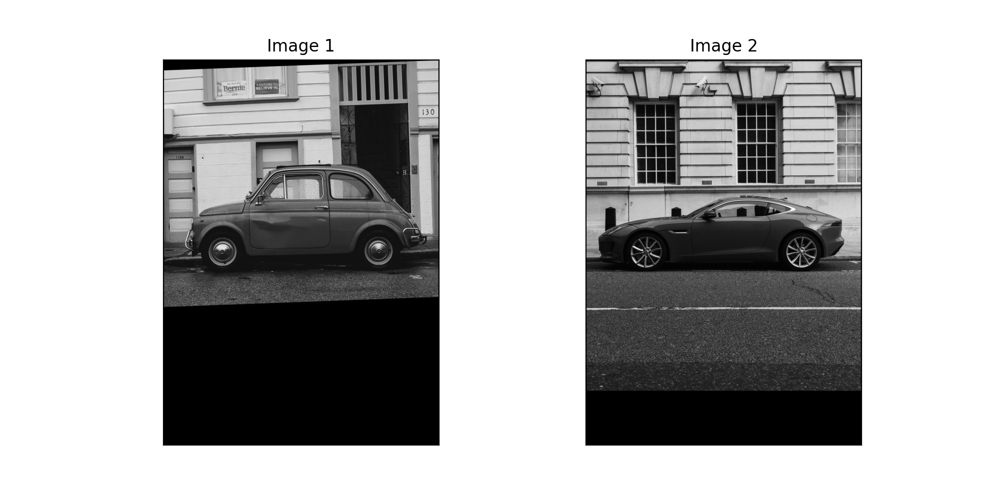

In [9]:
# Images sanity check
fig, axes = plt.subplots(1, 2, figsize=(10,5))
axes[0].imshow(im1,cmap='gray')
axes[0].set_title('Image 1'), axes[0].set_xticks([]), axes[0].set_yticks([])
axes[1].imshow(im2,cmap='gray')
axes[1].set_title('Image 2'), axes[1].set_xticks([]), axes[1].set_yticks([]);

In [10]:
def hybridImage(im1, im2, cutoff_low, cutoff_high,
                kernel_size_low=5, kernel_size_high=5, border=cv2.BORDER_REFLECT):
    '''
    Inputs:
        im1:    RGB (height x width x 3) or a grayscale (height x width) image
                as a numpy array.
        im2:    RGB (height x width x 3) or a grayscale (height x width) image
                as a numpy array.
        cutoff_low: standard deviation for the low-pass filter
        cutoff_high: standard deviation for the high-pass filter
        kernel_size_[low, high]: size to be used for respective filters (must be positive and odd)
        border: type of border interpolation to be used
        
    Output:
        Return im1 filtered with a low-pass filter, im2 filtered with a high-pass filter,
        and the combination of both images.
    '''    
    # Desired 2D kernel sizes in tuples
    kernel_2d_low = (kernel_size_low, kernel_size_low)
    kernel_2d_high = (kernel_size_high, kernel_size_high)
    
    # Apply Gaussian blur to images
    im1_low = cv2.GaussianBlur(im1, kernel_2d_low, cutoff_low, borderType=border)
    im2_low = cv2.GaussianBlur(im2, kernel_2d_high, cutoff_high, borderType=border)
    
    # Obtain high-pass filter of im2
    im2_high = im2 - im2_low
    
    # Return hybrid image
    return im1_low + im2_high, im1_low, im2_high

Creating the hybrid image is a quite straightforward process.
First, we load in the two images and apply a few preprocessing steps such as grayscale conversion and feature alignment.
For the actual merging process, we first select a appropriate kernel size for the Gaussian blur filter. Here, I have chosen to use a kernel size that is 3% of the size of the image(either the height or the width, whichever is smaller). I have also chosen to use an identical method in selecting the cutoff frequency.
After applying a Gaussian blur for both images, we subtract the blurred second image from the original second image to compute a high-pass filtered version of the image.
To get the hybrid image from here we need only add the low-pass version of the first image and the high-pass version of the second image together.

<IPython.core.display.Javascript object>


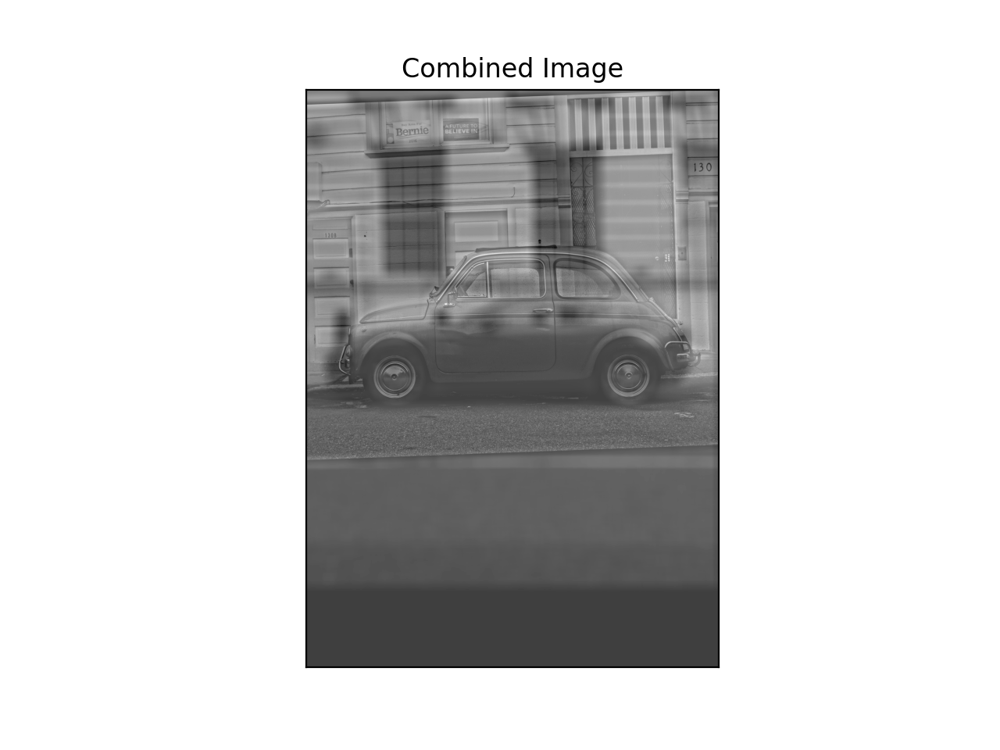

(Text(0.5, 1.0, 'Combined Image'), [], [])

In [11]:
# Compute kernel size for input images
im1_k = getKernelSize(im1.shape)
im2_k = getKernelSize(im2.shape)

# Filter input images and construct hybrid image
ret_hybrid, ret_low, ret_high = hybridImage(im2, im1,
                                            int(im1.shape[1]*0.03), int(im2.shape[1]*0.03), im1_k, im2_k)

fig, ax = plt.subplots()
ax.imshow(ret_hybrid, cmap='gray')
ax.set_title('Combined Image'), ax.set_xticks([]), ax.set_yticks([])

<IPython.core.display.Javascript object>


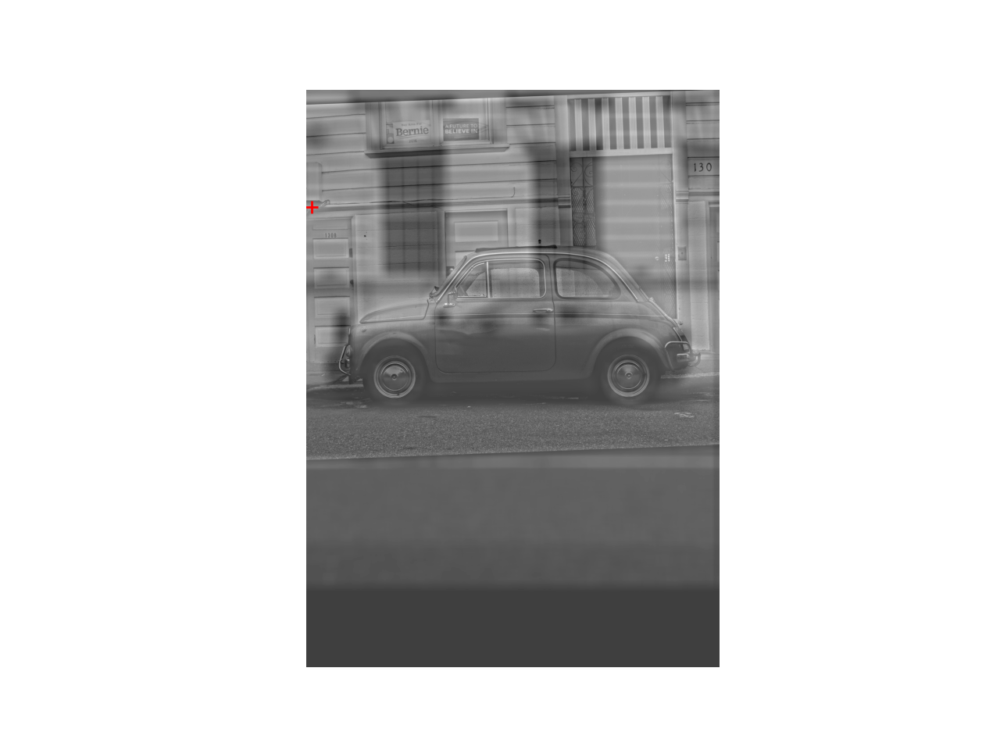

In [12]:
# Optional: Select top left corner and bottom right corner to crop image
# the function returns dictionary of 
# {
#   'cropped_image': np.ndarray of shape H x W
#   'crop_bound': np.ndarray of shape 2x2
# }
cropped_object = utils.interactive_crop(ret_hybrid)

<IPython.core.display.Javascript object>


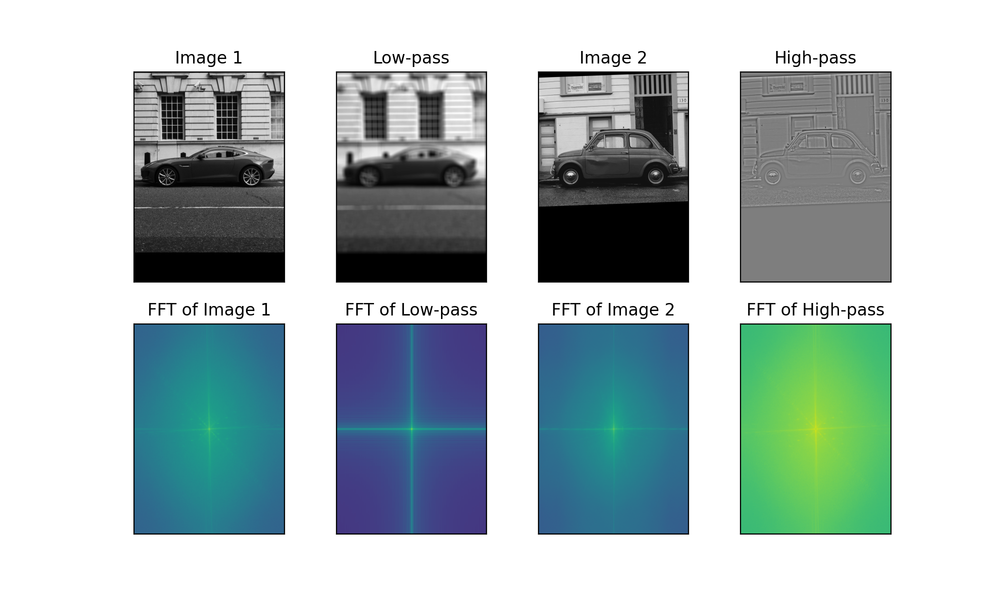

(Text(0.5, 1.0, 'FFT of High-pass'), [], [])

In [13]:
# Display input images, filtered input images, and their FFT images
fig_fft, ax_fft = plt.subplots(2, 4, figsize=(10,6))
ax_fft[0][0].imshow(im2, cmap='gray')
ax_fft[0][0].set_title('Image 1'), ax_fft[0][0].set_xticks([]), ax_fft[0][0].set_yticks([])
ax_fft[1][0].imshow(np.log(np.abs(np.fft.fftshift(np.fft.fft2(im1)))))
ax_fft[1][0].set_title('FFT of Image 1'), ax_fft[1][0].set_xticks([]), ax_fft[1][0].set_yticks([])
ax_fft[0][1].imshow(ret_low, cmap='gray')
ax_fft[0][1].set_title('Low-pass'), ax_fft[0][1].set_xticks([]), ax_fft[0][1].set_yticks([])
ax_fft[1][1].imshow(np.log(np.abs(np.fft.fftshift(np.fft.fft2(ret_low)))))
ax_fft[1][1].set_title('FFT of Low-pass'), ax_fft[1][1].set_xticks([]), ax_fft[1][1].set_yticks([])
ax_fft[0][2].imshow(im1, cmap='gray')
ax_fft[0][2].set_title('Image 2'), ax_fft[0][2].set_xticks([]), ax_fft[0][2].set_yticks([])
ax_fft[1][2].imshow(np.log(np.abs(np.fft.fftshift(np.fft.fft2(im2)))))
ax_fft[1][2].set_title('FFT of Image 2'), ax_fft[1][2].set_xticks([]), ax_fft[1][2].set_yticks([])
ax_fft[0][3].imshow(ret_high, cmap='gray')
ax_fft[0][3].set_title('High-pass'), ax_fft[0][3].set_xticks([]), ax_fft[0][3].set_yticks([])
ax_fft[1][3].imshow(np.log(np.abs(np.fft.fftshift(np.fft.fft2(ret_high)))))
ax_fft[1][3].set_title('FFT of High-pass'), ax_fft[1][3].set_xticks([]), ax_fft[1][3].set_yticks([])

<IPython.core.display.Javascript object>


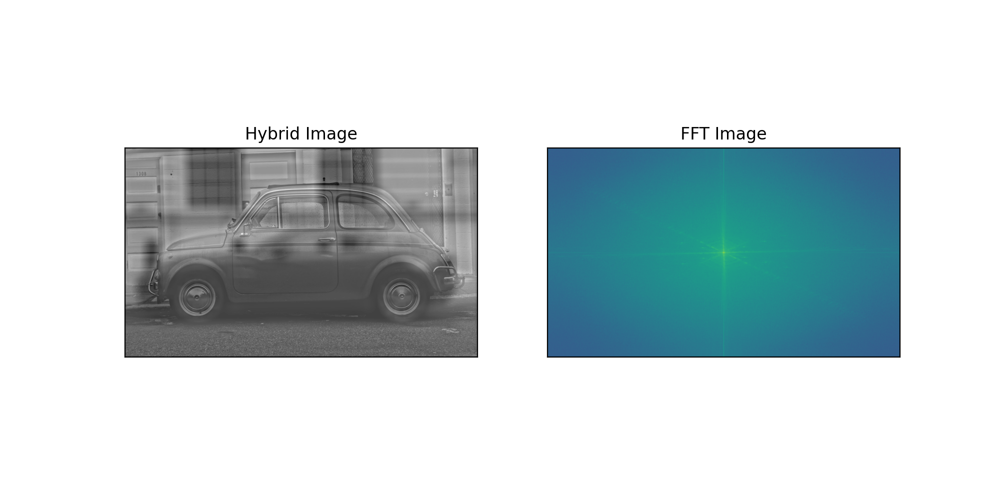

(Text(0.5, 1.0, 'FFT Image'), [], [])

In [14]:
# Display hybrid image and its FFT image
fig_fft, ax_fft = plt.subplots(1, 2, figsize=(10,5))
ax_fft[0].imshow(cropped_object['cropped_image'], cmap='gray')
ax_fft[0].set_title('Hybrid Image'), ax_fft[0].set_xticks([]), ax_fft[0].set_yticks([])
ax_fft[1].imshow(np.log(np.abs(np.fft.fftshift(np.fft.fft2(cropped_object['cropped_image'])))))
ax_fft[1].set_title('FFT Image'), ax_fft[1].set_xticks([]), ax_fft[1].set_yticks([])

In [15]:
# Image source: Manja Vitolic (https://unsplash.com/photos/gKXKBY-C-Dk)
hb2a_file = './hybrid2_a.jpg'
# Image source: Kelli McClintock (https://unsplash.com/photos/eKZFEW0-nH4)
hb2b_file = './hybrid2_b.jpg'
# Image source: Mia Baker (https://unsplash.com/photos/loyuIqiwkkA)
hb3a_file = './hybrid3_a.jpg'
# Image source: David Hepworth (https://unsplash.com/photos/zXSigG8Uq68)
hb3b_file = './hybrid3_b.jpg'

hb2a = cv2.imread(hb2a_file, cv2.IMREAD_GRAYSCALE)
hb2b = cv2.imread(hb2b_file, cv2.IMREAD_GRAYSCALE)
hb3a = cv2.imread(hb3a_file, cv2.IMREAD_GRAYSCALE)
hb3b = cv2.imread(hb3b_file, cv2.IMREAD_GRAYSCALE)

<IPython.core.display.Javascript object>


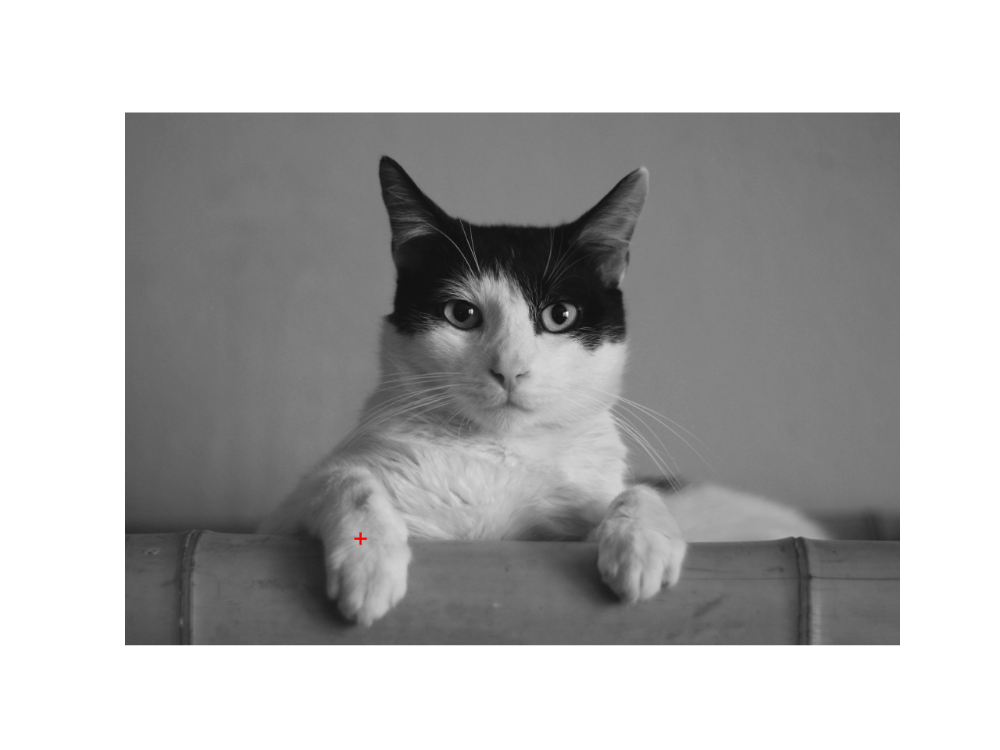

In [16]:
pts_hb2a = utils.prompt_eye_selection(hb2a)

<IPython.core.display.Javascript object>


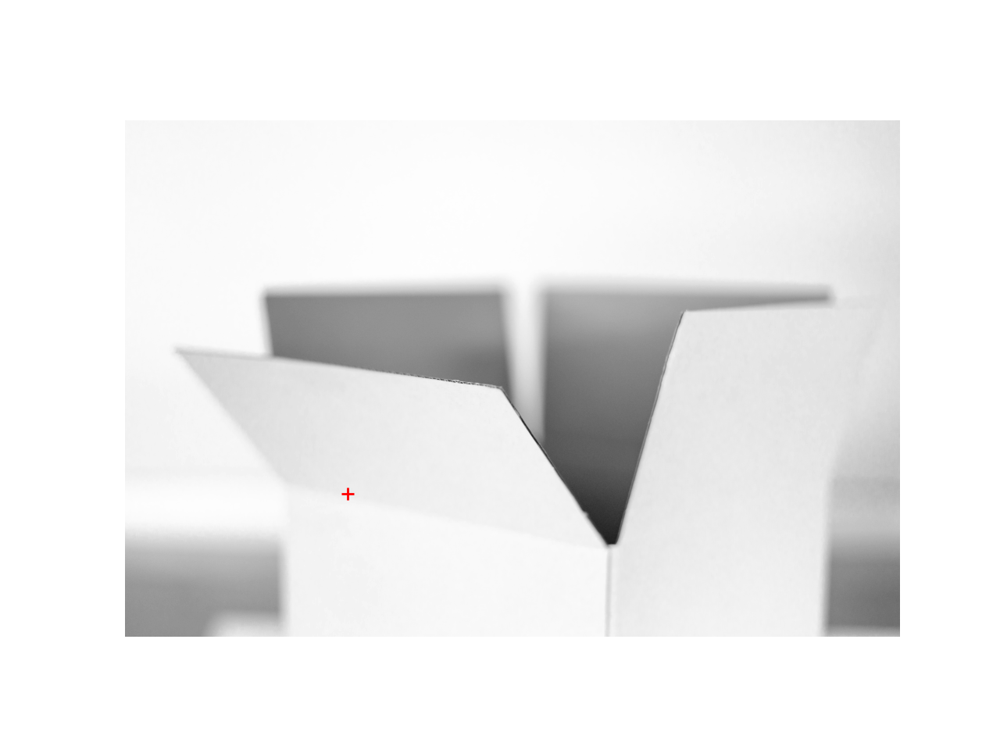

In [17]:
pts_hb2b = utils.prompt_eye_selection(hb2b)

<IPython.core.display.Javascript object>


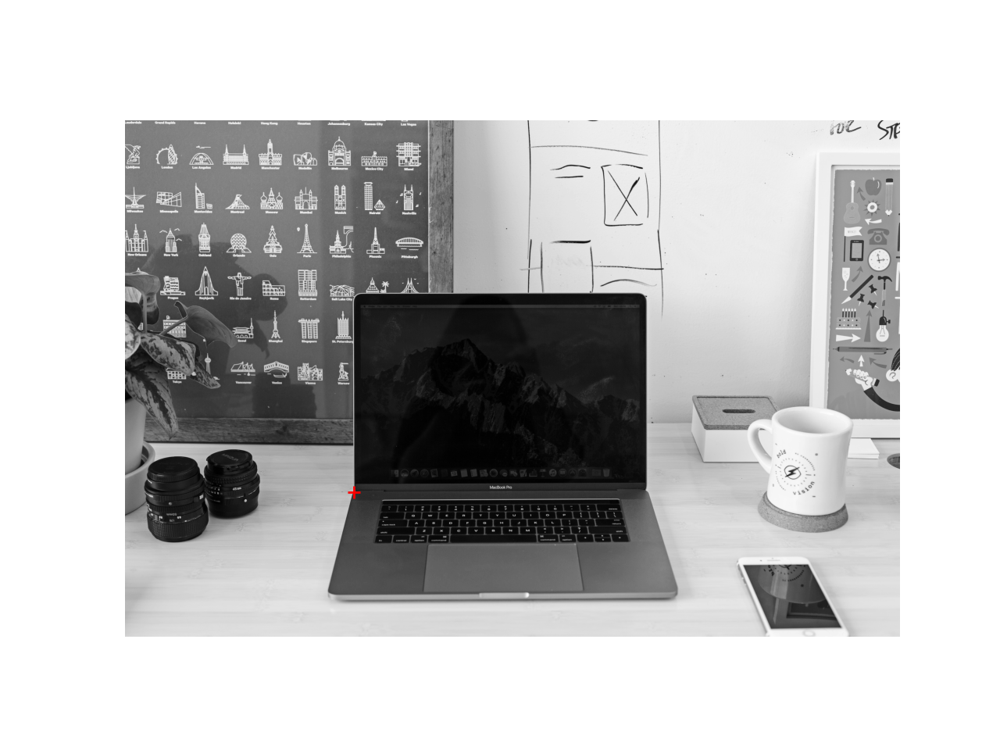

In [18]:
pts_hb3a = utils.prompt_eye_selection(hb3a)

<IPython.core.display.Javascript object>


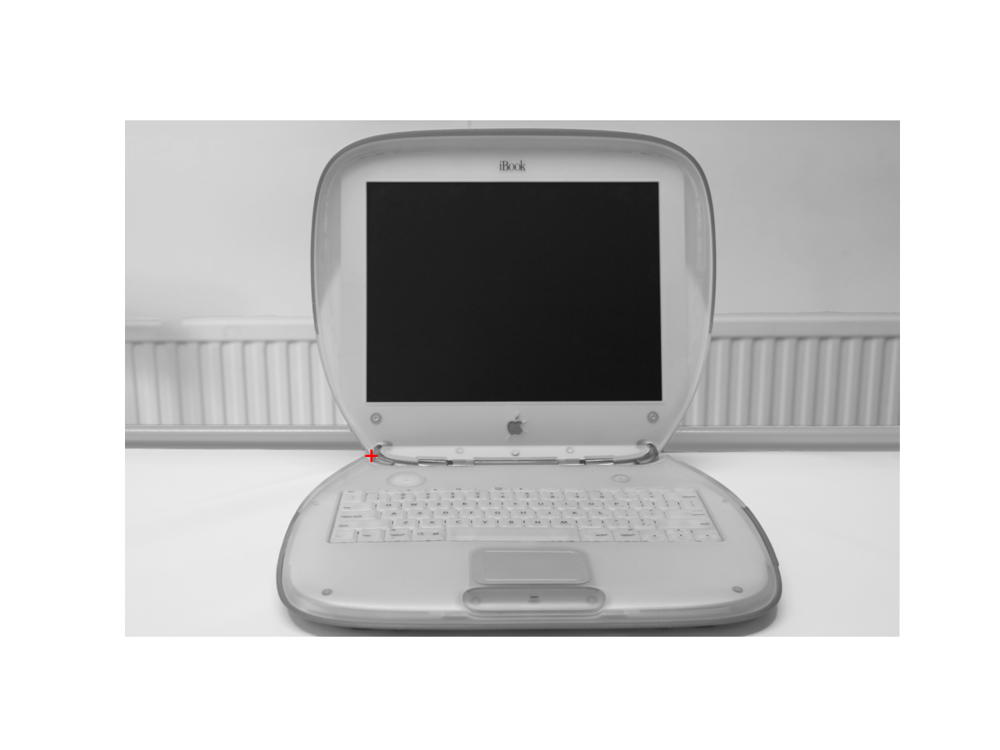

In [19]:
pts_hb3b = utils.prompt_eye_selection(hb3b)

Here are two more hybrid images constructed using the same method described above.

(Text(0.5, 1.0, 'Improvements'), [], [])

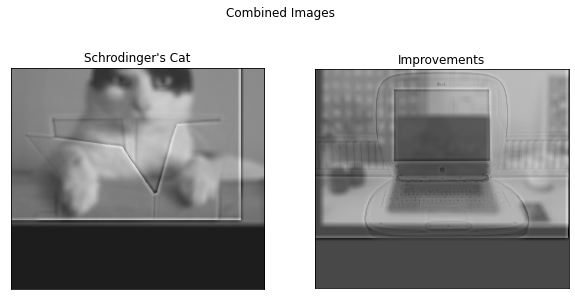

In [23]:
hb2a, hb2b = utils.align_images(hb2a_file, hb2b_file,pts_hb2a,pts_hb2b,save_images=False)
hb3a, hb3b = utils.align_images(hb3a_file, hb3b_file,pts_hb3a,pts_hb3b,save_images=False)
hb2a = cv2.cvtColor(hb2a, cv2.COLOR_BGR2GRAY) / 255.0
hb2b = cv2.cvtColor(hb2b, cv2.COLOR_BGR2GRAY) / 255.0
hb3a = cv2.cvtColor(hb3a, cv2.COLOR_BGR2GRAY) / 255.0
hb3b = cv2.cvtColor(hb3b, cv2.COLOR_BGR2GRAY) / 255.0

hb2_hybrid, hb2_low, hb2_high = hybridImage(hb2a, hb2b,
                                            int(hb2a.shape[1]*0.03), int(hb2b.shape[1]*0.03),
                                            getKernelSize(hb2a.shape), getKernelSize(hb2b.shape))

hb3_hybrid, hb3_low, hb3_high = hybridImage(hb3a, hb3b,
                                            int(hb3a.shape[1]*0.03), int(hb3b.shape[1]*0.03),
                                            getKernelSize(hb3a.shape), getKernelSize(hb3b.shape))

fig, ax = plt.subplots(1, 2, figsize=(10,5))
fig.suptitle('Combined Images')
ax[0].imshow(hb2_hybrid, cmap='gray')
ax[0].set_title('Schrodinger\'s Cat'), ax[0].set_xticks([]), ax[0].set_yticks([])
ax[1].imshow(hb3_hybrid, cmap='gray')
ax[1].set_title('Improvements'), ax[1].set_xticks([]), ax[1].set_yticks([])

And finally, shown below are 4-level Gaussian and Laplacian pyramids of the first hybrid image.

In [72]:
gau_pyr = []
lap_pyr = []
hybrid_img = cropped_object['cropped_image']

for i in range(8):
    # Compute kernel size and lower-res image size
    hybrid_kernel = (getKernelSize(hybrid_img.shape), getKernelSize(hybrid_img.shape))
    dest_size = (int(hybrid_img.shape[1]*0.5), int(hybrid_img.shape[0]*0.5))
    
    # Apply Gaussian blur to hybrid image
    temp = cv2.GaussianBlur(hybrid_img, hybrid_kernel,
                            int(hybrid_img.shape[1] * 0.03), borderType=cv2.BORDER_REFLECT)
    
    gau_pyr.append(temp)
    
    # Compute laplacian image
    lap_pyr.append(hybrid_img - temp)
    
    # Resize hybrid image
    hybrid_img = cv2.resize(hybrid_img, dsize=dest_size, interpolation=cv2.INTER_NEAREST)

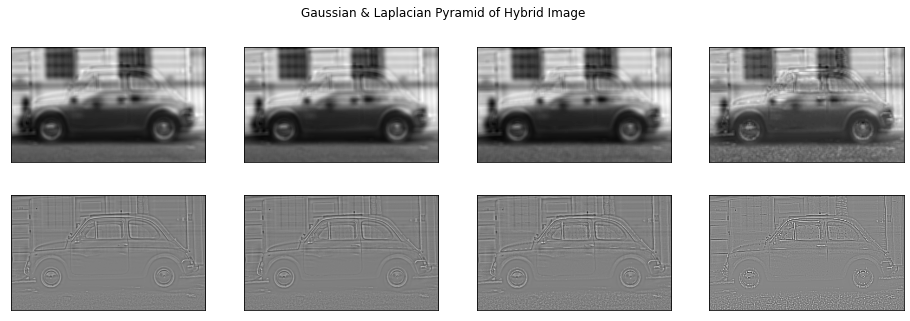

In [80]:
gpyr_plt, gpyr_ax = plt.subplots(2, 4, figsize=(16, 5))
gpyr_plt.suptitle('Gaussian & Laplacian Pyramid of Hybrid Image')
for i in range(1, 5):
        gpyr_ax[0][i-1].imshow(gau_pyr[i], cmap='gray')
        gpyr_ax[0][i-1].set_xticks([])
        gpyr_ax[0][i-1].set_yticks([])
        gpyr_ax[1][i-1].imshow(lap_pyr[i], cmap='gray')
        gpyr_ax[1][i-1].set_xticks([])
        gpyr_ax[1][i-1].set_yticks([])

### Part II: Image Enhancement

##### Two out of three types of image enhancement are required.  Choose a good image to showcase each type and implement a method.  This code doesn't rely on the hybrid image part.

#### Contrast enhancement

Shown below is an image before applying contrast enhancement, and a 'before and after' comparision of the image with contrast enhancement applied.
First, the original image is converted to the HSV color space for easier manipulation.
Then, we apply histogram equalization to the V channel and then reconvert the image into RGB color space.
Histogram equalization was chosen since it does not change the intensity of the image while evenly distributing intensity values in such a way that the overall V values are not 'skewed' anymore, resulting in an image with better contrast.

(Text(0.5, 1.0, 'Original Image'), [], [])

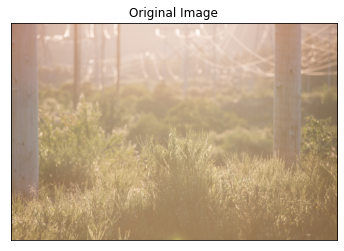

In [81]:
# Image source: https://www.dpreview.com/forums/post/57800476?image=0
im3 = cv2.cvtColor(cv2.imread('./contrast.jpg', cv2.IMREAD_COLOR), cv2.COLOR_BGR2RGB)

# Import and display original image
fig_contr_orig, ax_contr_orig = plt.subplots()
ax_contr_orig.imshow(im3)
ax_contr_orig.set_title('Original Image'), ax_contr_orig.set_xticks([]), ax_contr_orig.set_yticks([])

(Text(0.5, 1.0, 'Adjusted Image'), [], [])

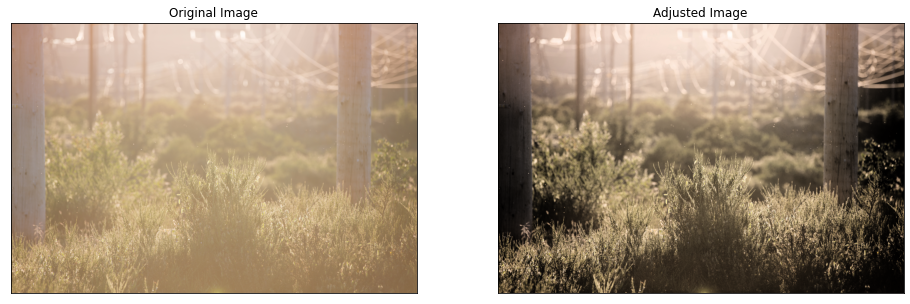

In [83]:
y, x, c = im3.shape
im3_hsv = np.zeros((y, x, c), dtype=np.uint8)

# Convert original RGB image to HSV color space
im3_hsv = cv2.cvtColor(im3, cv2.COLOR_RGB2HSV)

'''
# Separate H, S, and V channels
h = np.zeros((y, x, c), dtype=np.uint8)
s = np.zeros((y, x, c), dtype=np.uint8)
v = np.zeros((y, x, c), dtype=np.uint8)

# Adjust other channels appropriately
h[:,:,0] = im3_hsv[:,:,0]
h[:,:,1] = 255
h[:,:,2] = 255
s[:,:,0] = 255
s[:,:,1] = im3_hsv[:,:,1]
s[:,:,2] = 255
v[:,:,0] = 255
v[:,:,2] = im3_hsv[:,:,2]

# Convert each extracted channel to RGB color space
h_rgb = cv2.cvtColor(h, cv2.COLOR_HSV2RGB)
s_rgb = cv2.cvtColor(s, cv2.COLOR_HSV2RGB)
v_rgb = cv2.cvtColor(v, cv2.COLOR_HSV2RGB)

# Display RGB image representations of HSV channels
fig_t, ax_t = plt.subplots(1, 3)
ax_t[0].imshow(h_rgb), ax_t[0].set_xticks([]), ax_t[0].set_yticks([])
ax_t[1].imshow(s_rgb), ax_t[1].set_xticks([]), ax_t[1].set_yticks([])
ax_t[2].imshow(v_rgb), ax_t[2].set_xticks([]), ax_t[2].set_yticks([])
'''

# Apply histogram equalization to V channel
im3_hsv[:,:,2] = cv2.equalizeHist(im3_hsv[:,:,2])

# Convert back to RGB color space
im3_corrected_rgb = cv2.cvtColor(im3_hsv, cv2.COLOR_HSV2RGB)

# Display original and adjusted images
fig_corrected, ax_corrected = plt.subplots(1, 2, figsize=(16,8))
ax_corrected[0].imshow(im3)
ax_corrected[0].set_title('Original Image'), ax_corrected[0].set_xticks([]), ax_corrected[0].set_yticks([])
ax_corrected[1].imshow(im3_corrected_rgb)
ax_corrected[1].set_title('Adjusted Image'), ax_corrected[1].set_xticks([]), ax_corrected[1].set_yticks([])

#### Color enhancement 

Shown below is an image before color enhancement is applied, and a 'before and after' comparision of the original image and the image after color enhancement is applied.
Similar to contrast enhancement, we first convert to the HSV color space for easier manipulation. Then we apply gamma correction (with a gamma value of 1.1) to the S channel and use np.clip() to ensure that the values can be expressed as uint8.
Gamma correction with clip prevention was chosen since it naturally corrects the hues in such a way that low values (very muted colors) increase relatively less than higher values (less muted colors). This is important in order to get a natural result since applying a fixed adjustment on all values would result in unintended color shifts.
For example, say in the original image there is a white patch that is slightly tinted blue. We would want this image to stay white after the adjustment - applying gamma adjustment ensures that the change in saturation would be small compared to more saturated colors, which is not the case if adding a fixed value to all values in the image.

(Text(0.5, 1.0, 'Original Image'), [], [])

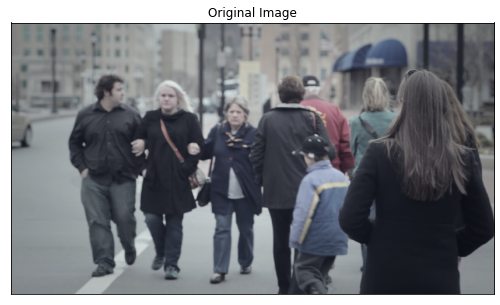

In [86]:
# Image source: http://aaronwilliams.tv/2012/04/low-con-look/
im4 = cv2.cvtColor(cv2.imread('./saturation.jpg', cv2.IMREAD_COLOR), cv2.COLOR_BGR2RGB)

# Import and display original image
fig_sat_orig, ax_sat_orig = plt.subplots(figsize=(15,5))
ax_sat_orig.imshow(im4)
ax_sat_orig.set_title('Original Image'), ax_sat_orig.set_xticks([]), ax_sat_orig.set_yticks([])

(Text(0.5, 1.0, 'Adjusted Image'), [], [])

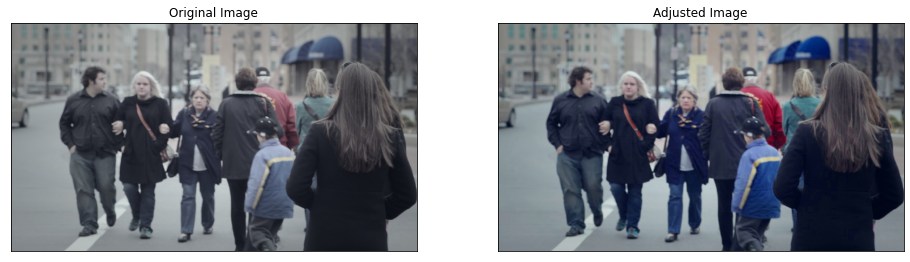

In [87]:
y, x, c = im4.shape
im4_hsv = np.zeros((y, x, c), dtype=np.uint8)

# Convert original RGB image to HSV color space
im4_hsv = cv2.cvtColor(im4, cv2.COLOR_RGB2HSV)

# Apply gamma adjustment to S channel
im4_hsv[:,:,1] = np.clip(im4_hsv[:,:,1] ** 1.2, 0, 255)

# Convert back to RGB color space
im4_rgb = cv2.cvtColor(im4_hsv, cv2.COLOR_HSV2RGB)

# Display original and adjusted images
fig_corrected_sat, ax_corrected_sat = plt.subplots(1, 2, figsize=(16,5))
ax_corrected_sat[0].imshow(im4)
ax_corrected_sat[0].set_title('Original Image'), ax_corrected_sat[0].set_xticks([]), ax_corrected_sat[0].set_yticks([])
ax_corrected_sat[1].imshow(im4_rgb)
ax_corrected_sat[1].set_title('Adjusted Image'), ax_corrected_sat[1].set_xticks([]), ax_corrected_sat[1].set_yticks([])

#### Color shift

Shown below is an image before color shift is applied, and a 'before and after' comparision of the original image and the image after applying color shift.
This time we convert the image to the Lab color space, specifically in order to access the b channel which represents how yellow or blue an image is.
Then, similar to color enhancement, we apply gamma correction (with a gamma value of 1.1) to the image and run the result through np.clip().
In this case however since we do not care about the result looking natural, a simpler adjustment involving adding a fixed value across the b channel would have sufficed.

(Text(0.5, 1.0, 'Original Image'), [], [])

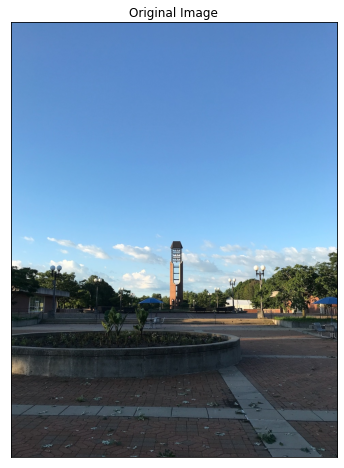

In [90]:
# Image source: self-provided
im5 = cv2.cvtColor(cv2.imread('./shift.jpeg', cv2.IMREAD_COLOR), cv2.COLOR_BGR2RGB)

# Import and display original image
fig_sat_orig, ax_sat_orig = plt.subplots(figsize=(10,8))
ax_sat_orig.imshow(im5)
ax_sat_orig.set_title('Original Image'), ax_sat_orig.set_xticks([]), ax_sat_orig.set_yticks([])

([], [])

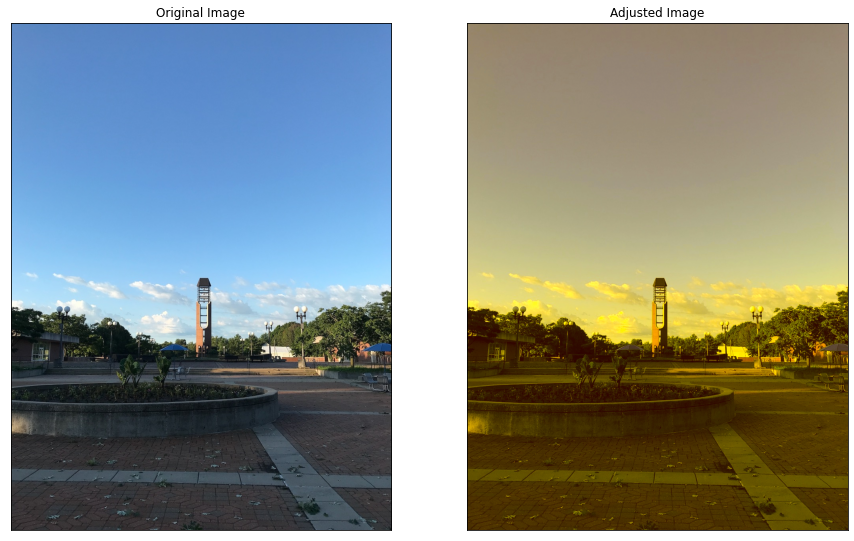

In [92]:
y, x, c = im5.shape
im5_lab = np.zeros((y, x, c), dtype=np.uint8)

# Convert original RGB image to CIE-Lab color space
im5_lab = cv2.cvtColor(im5, cv2.COLOR_RGB2Lab)

# Apply gamma adjustment to b channel
im5_lab[:,:,2] = np.clip(im5_lab[:,:,2] ** 1.1, 0, 255)

# Convert back to RGB color space
im5_rgb = cv2.cvtColor(im5_lab, cv2.COLOR_Lab2RGB)

# Display original and adjusted images
fig_corrected_shift, ax_corrected_shift = plt.subplots(1, 2, figsize=(15, 10))
ax_corrected_shift[0].imshow(im5)
ax_corrected_shift[0].set_title('Original Image')
ax_corrected_shift[0].set_xticks([]), ax_corrected_shift[0].set_yticks([])
ax_corrected_shift[1].imshow(im5_rgb)
ax_corrected_shift[1].set_title('Adjusted Image')
ax_corrected_shift[1].set_xticks([]), ax_corrected_shift[1].set_yticks([])